In [128]:
import os
import json
import pickle
import cv2
import numpy as np
import torch

from PIL import Image
from IPython.display import display

In [129]:
## Get Bounding Box Annotations
def get_bbox_annotations(directory_input, filename):
#     bbox_file = 'bboxes/'+directory_input+'/'+filename+'_gtBboxCityPersons.json'
    bbox_file = directory_input+'/' + filename
    bbox_list = []
    with open(bbox_file) as f:
        data = json.load(f)
        for obj in data['objects']:
            if obj['label'] == 'pedestrian':
#                 print(obj)
                bbox_list.append(obj['bboxVis'])

                
    return bbox_list

In [130]:
# image_path = 'hamburg_000000_085073_leftImg8bit.png'
image_path = 'erfurt_000070_000019_leftImg8bit.png'
image = image_path[:-16]
city = image.split('_')[0]
directory = 'example_erfurt_2stage'


bboxes = get_bbox_annotations(directory, image+'_gtBboxCityPersons.json')
bboxes

[[1244, 435, 8, 24],
 [1400, 435, 13, 30],
 [1262, 431, 13, 29],
 [1196, 423, 17, 41],
 [808, 361, 70, 169],
 [672, 336, 80, 198]]

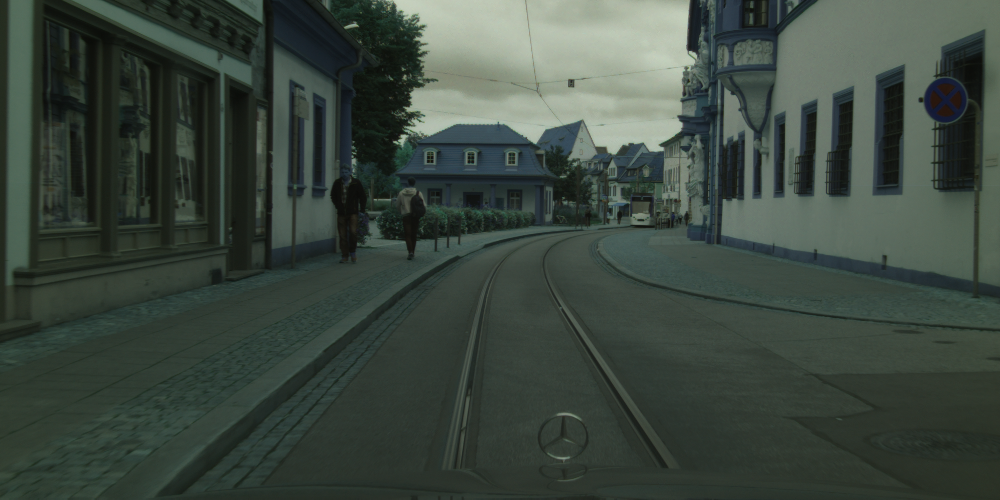

In [139]:
## Read Image
img = cv2.imread(directory + '/'+ image_path)
assert img.shape == (1024, 2048, 3)

## Display Image
# img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB for display
img_display = img
display(Image.fromarray(img_display))


4 [808, 361, 70, 169]
height 169
width 70
x1 808
x2 878
y1 361
y2 530


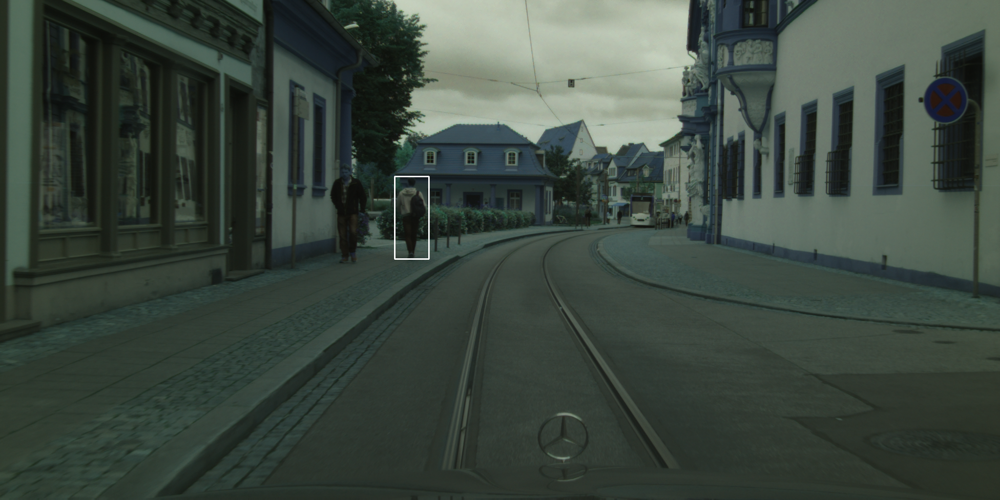

5 [672, 336, 80, 198]
height 198
width 80
x1 672
x2 752
y1 336
y2 534


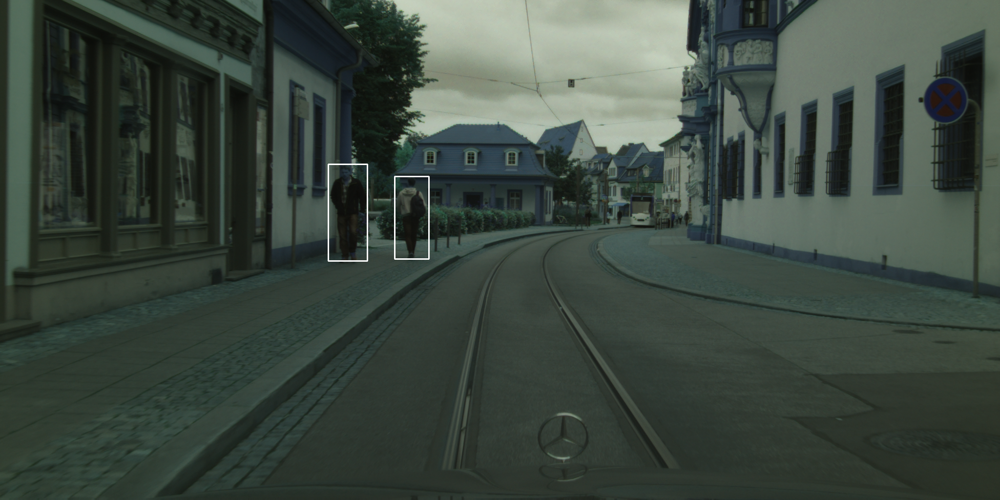

[[808, 878, 361, 530], [672, 752, 336, 534]]


In [140]:
img_bboxes= img_display.copy()
anonymize_person_list = [4,5]

bboxes_list_ = []

for person_id in range(len(bboxes)):
    if person_id in anonymize_person_list:
        x, y, w, h = bboxes[person_id]
        bboxes_list_.append([x, x+w, y, y+h])
        print(person_id, bboxes[person_id])
        print('height', h)
        print('width', w)
        print('x1', x)
        print('x2', x+w)
        print('y1', y)
        print('y2', y+h)

        cv2.rectangle(img_bboxes, (x, y), (x+w, y+h), (255, 255, 255), 2)
        display(Image.fromarray(img_bboxes))
        
print(bboxes_list_)

# Image 4

(256, 256, 3)


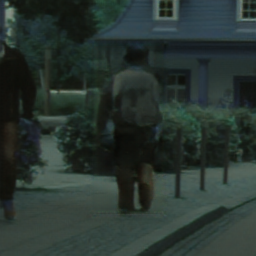

In [141]:
## Read Image
real_B_path_4 = 'erfurt_000070_000019_4_fake_B.png'
img4 = cv2.imread(directory + '/' + real_B_path_4)
# assert img.shape == (1024, 2048, 3)
print(img4.shape)

## Display Image
# img4_display = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB) # Converting BGR to RGB for display
img4_display = img4
display(Image.fromarray(img4_display))

In [142]:
# bboxes4 = get_bbox_annotations(directory, 'erfurt_000070_000019_4.json')
# {"x1": 93, "y1": 44, "x2": 164, "y2": 214}
bbox_file4 = directory + '/erfurt_000070_000019_4.json'
with open(bbox_file4) as f:
    bboxes4 = json.load(f)
    print(bboxes4)

{'x1': 93, 'y1': 44, 'x2': 164, 'y2': 214}


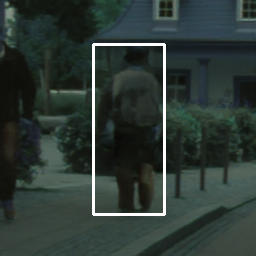

In [143]:
img4_bboxes= img4_display.copy()

cv2.rectangle(img4_bboxes, (bboxes4['x1'], bboxes4['y1']), (bboxes4['x2'], bboxes4['y2']), (255, 255, 255), 2)
display(Image.fromarray(img4_bboxes))

In [144]:
print('height', bboxes4['y2'] - bboxes4['y1'])
print('width', bboxes4['x2'] - bboxes4['x1'])

height 170
width 71


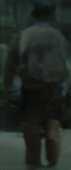

In [145]:
img4_crop = img4_display.copy()
img4_crop = img4_crop[bboxes4['y1']:bboxes4['y2'], bboxes4['x1']:bboxes4['x2'], :]
display(Image.fromarray(img4_crop))

# Image 5

(256, 256, 3)


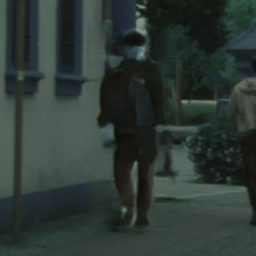

In [146]:
## Read Image
real_B_path_5 = 'erfurt_000070_000019_5_fake_B.png'
img5 = cv2.imread(directory + '/' + real_B_path_5)
# assert img.shape == (1024, 2048, 3)
print(img5.shape)

## Display Image
# img5_display = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB) # Converting BGR to RGB for display
img5_display = img5
display(Image.fromarray(img5_display))

In [147]:
bbox_file5 = directory + '/erfurt_000070_000019_5.json'
with open(bbox_file5) as f:
    bboxes5 = json.load(f)
    print(bboxes5)

{'x1': 88, 'y1': 29, 'x2': 169, 'y2': 228}


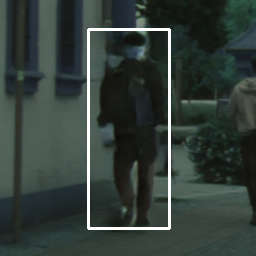

In [148]:
img5_bboxes= img5_display.copy()

cv2.rectangle(img5_bboxes, (bboxes5['x1'], bboxes5['y1']), (bboxes5['x2'], bboxes5['y2']), (255, 255, 255), 2)
display(Image.fromarray(img5_bboxes))

In [149]:
print('height', bboxes5['y2'] - bboxes5['y1'])
print('width', bboxes5['x2'] - bboxes5['x1'])

height 199
width 81


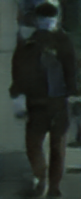

In [150]:
img5_crop = img5_display.copy()
img5_crop = img5_crop[bboxes5['y1']:bboxes5['y2'], bboxes5['x1']:bboxes5['x2'], :]
display(Image.fromarray(img5_crop))

# Anonymize People

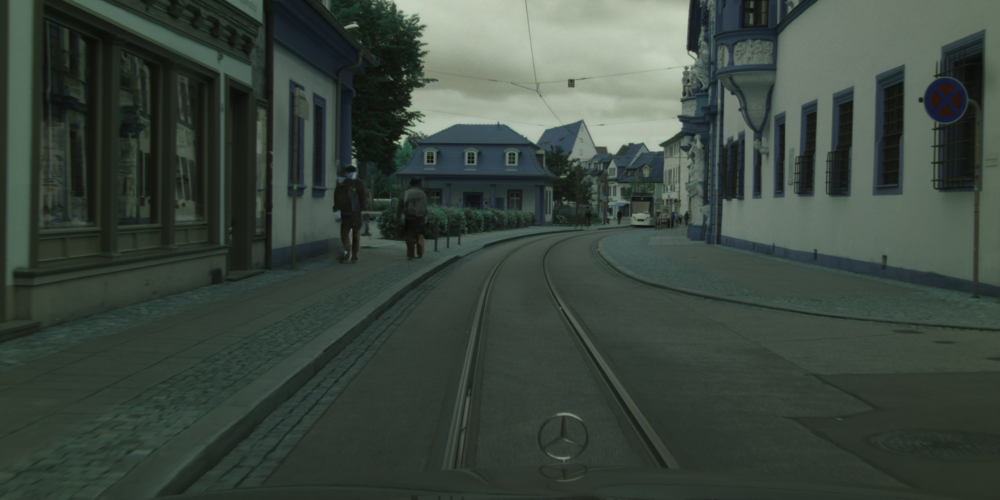

In [151]:
img_anon = img_display.copy()

# 4 [808, 878, 361, 530]
# height 169
# width 70

# 5 [672, 752, 336, 534]
# height 198
# width 80

img_anon[361:531, 808:879, :] = img4_crop

img_anon[336:535, 672:753, :] = img5_crop
display(Image.fromarray(img_anon))

In [186]:
img_h, img_w, _ = img_anon.shape
print(img_h, img_h/4)
print(img_w, img_w/4)
new_img_h = img_w//5
new_img_w = img_w//5


new_x1 = 570 #600 //6 #500  //4
new_y1 = 220 #260 //6 #150  //4
new_x2 = new_x1 + new_img_w
new_y2 = new_y1 + new_img_h

1024 256.0
2048 512.0


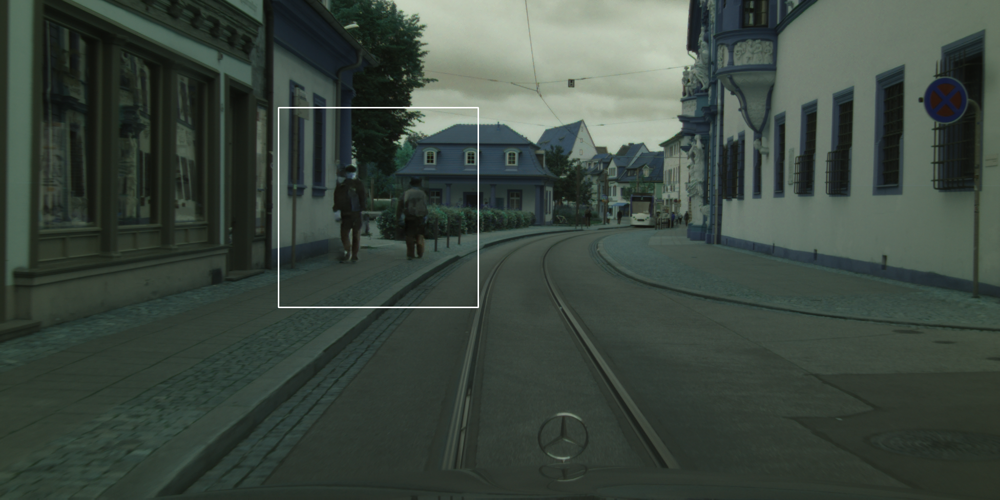

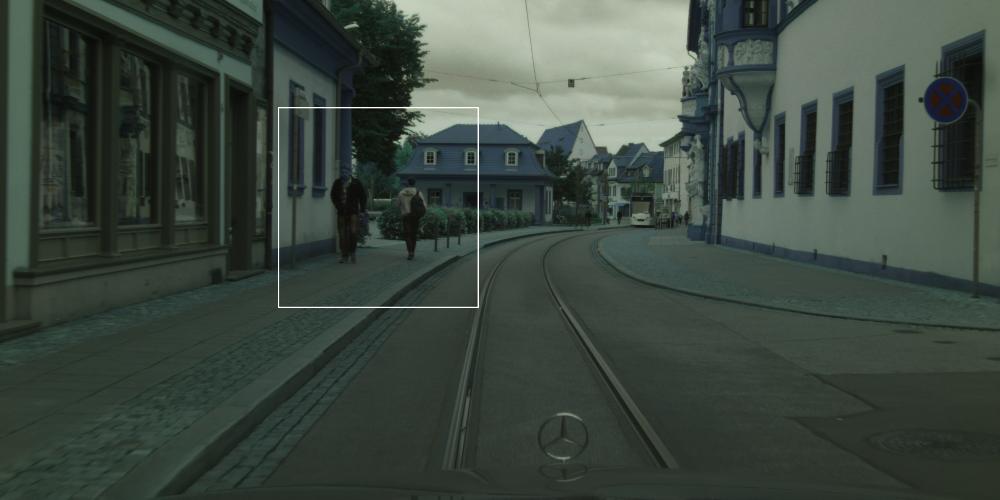

In [187]:
img_anon_cropped = img_anon.copy()
cv2.rectangle(img_anon_cropped, (new_x1, new_y1), (new_x2, new_y2), (255, 255, 255), 2)
display(Image.fromarray(img_anon_cropped))

img_cropped = img_display.copy()
cv2.rectangle(img_cropped, (new_x1, new_y1), (new_x2, new_y2), (255, 255, 255), 2)
display(Image.fromarray(img_cropped))

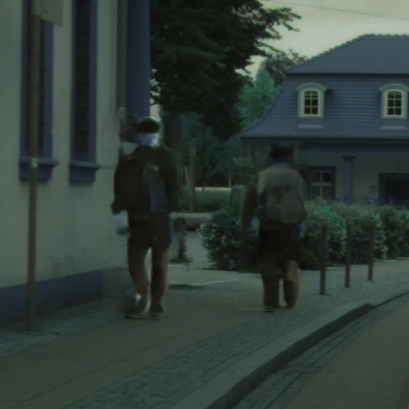

(409, 409, 3)


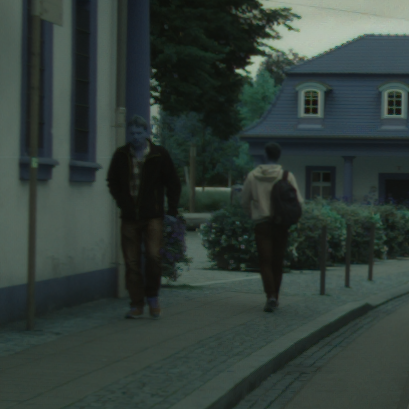

(409, 409, 3)


In [188]:

img_anon_cropped = img_anon[new_y1:new_y2, new_x1:new_x2, :]
display(Image.fromarray(img_anon_cropped))
print(img_anon_cropped.shape)


img_cropped = img_display[new_y1:new_y2, new_x1:new_x2, :]
display(Image.fromarray(img_cropped))
print(img_cropped.shape)

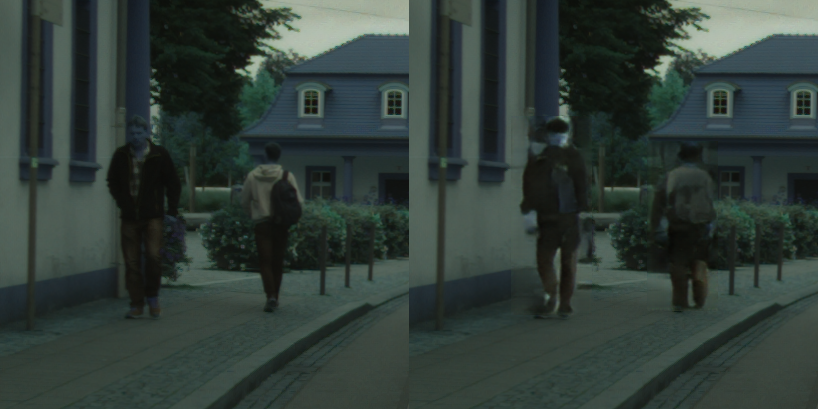

(409, 818, 3)


In [189]:
img_both = np.concatenate([img_cropped, img_anon_cropped], 1)
display(Image.fromarray(img_both))
print(img_both.shape)

---

# Save Images

In [190]:
cv2.imwrite(directory + '/erfurt_000070_000019_4_5_anonymized_cropped_v5'+ '.png', img_anon_cropped)
cv2.imwrite(directory + '/erfurt_000070_000019_4_5_real_cropped_v5'+ '.png', img_cropped)
cv2.imwrite(directory + '/erfurt_000070_000019_4_5_both_cropped_v5'+ '.png', img_both)

True

---